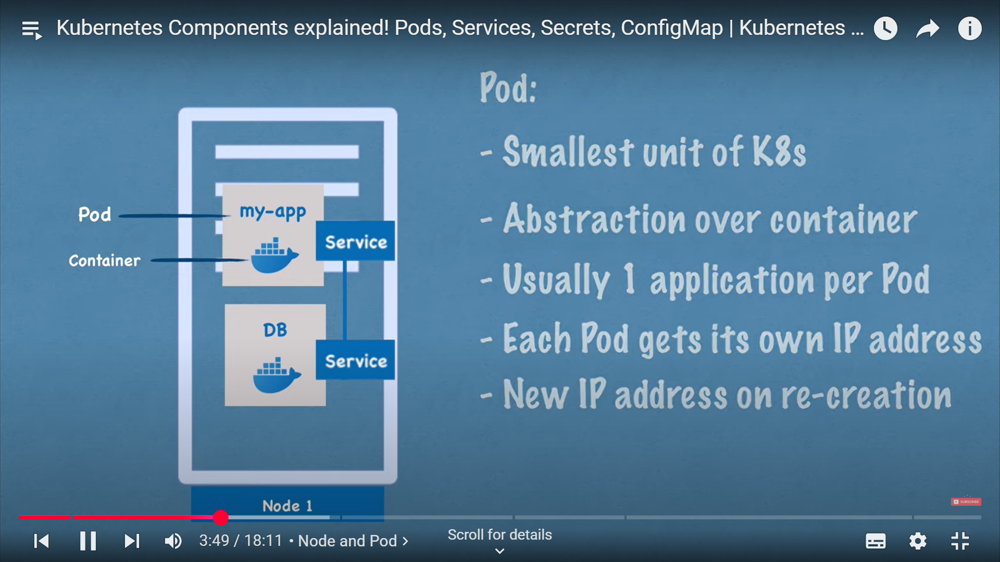

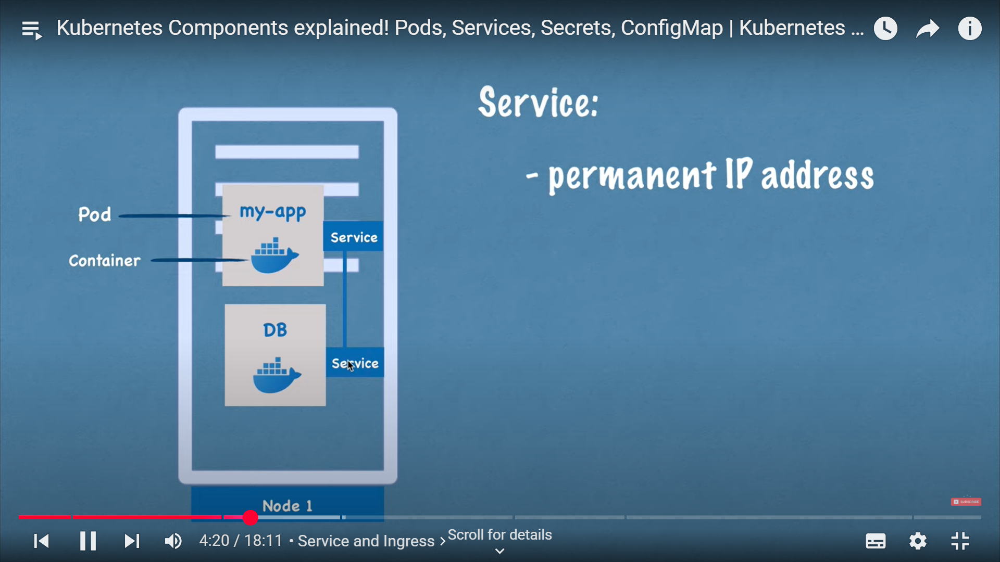

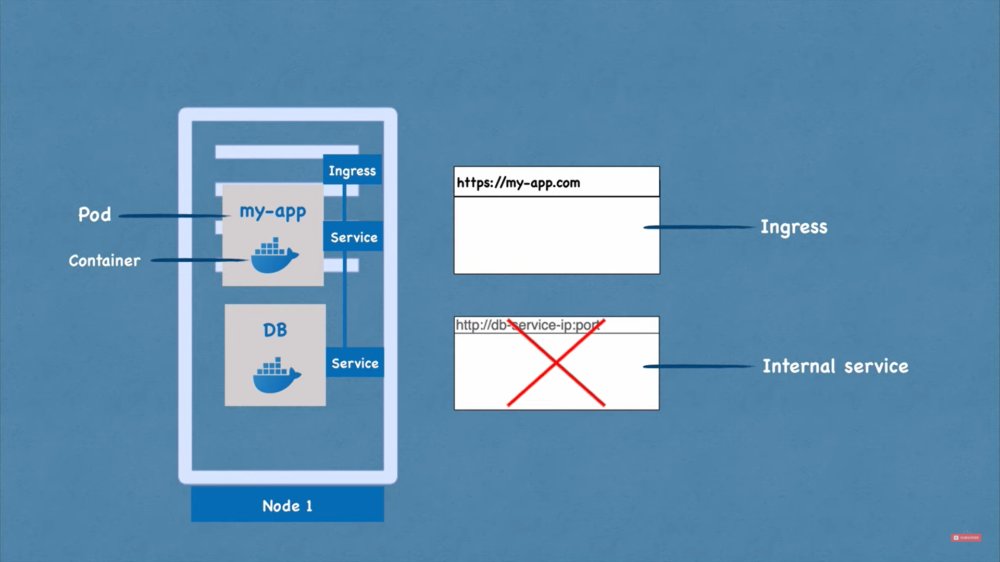

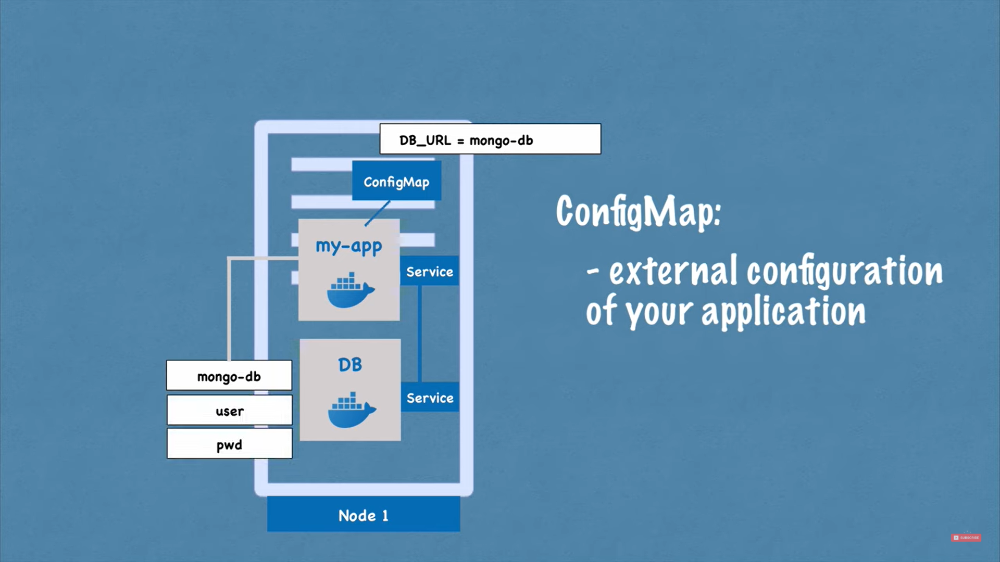

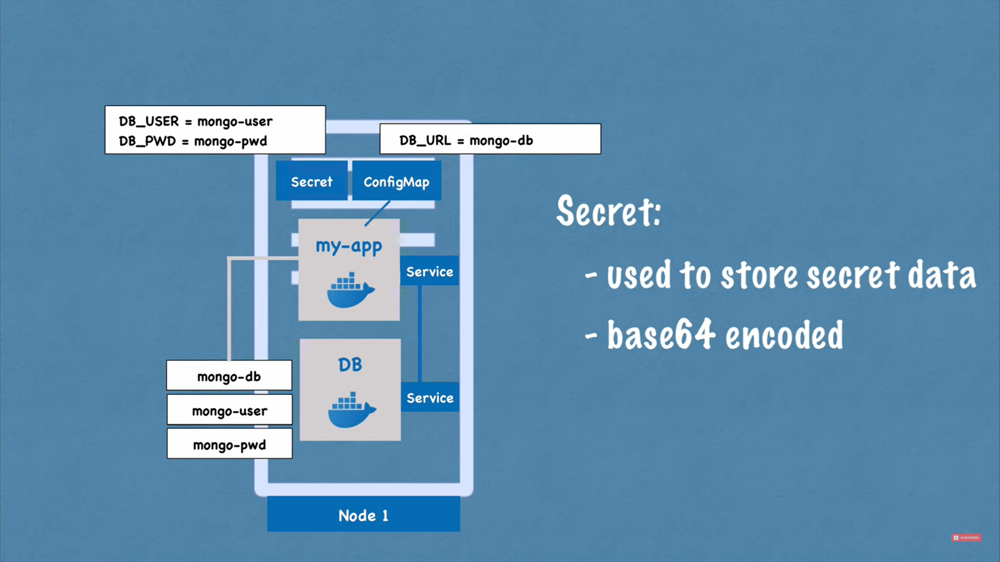

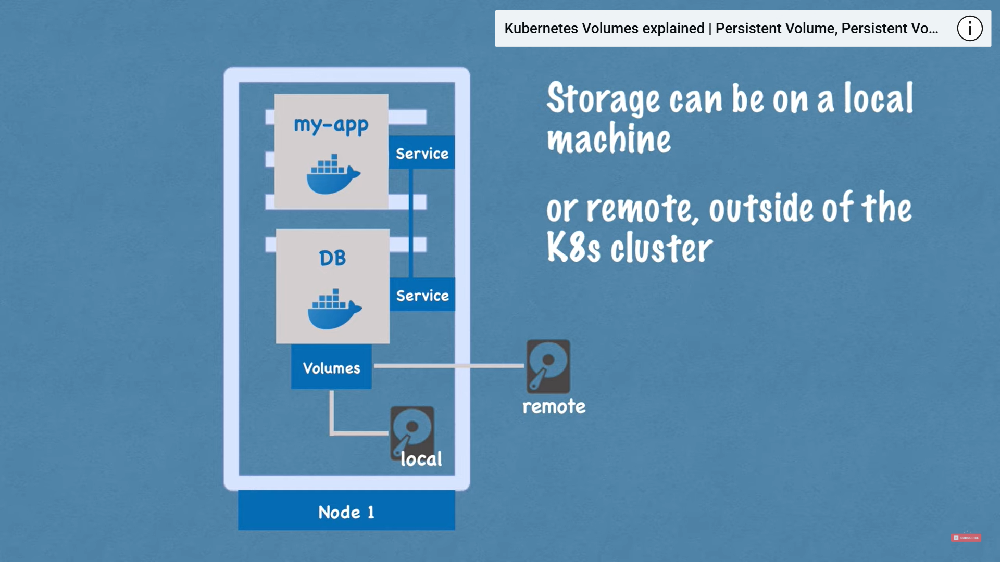

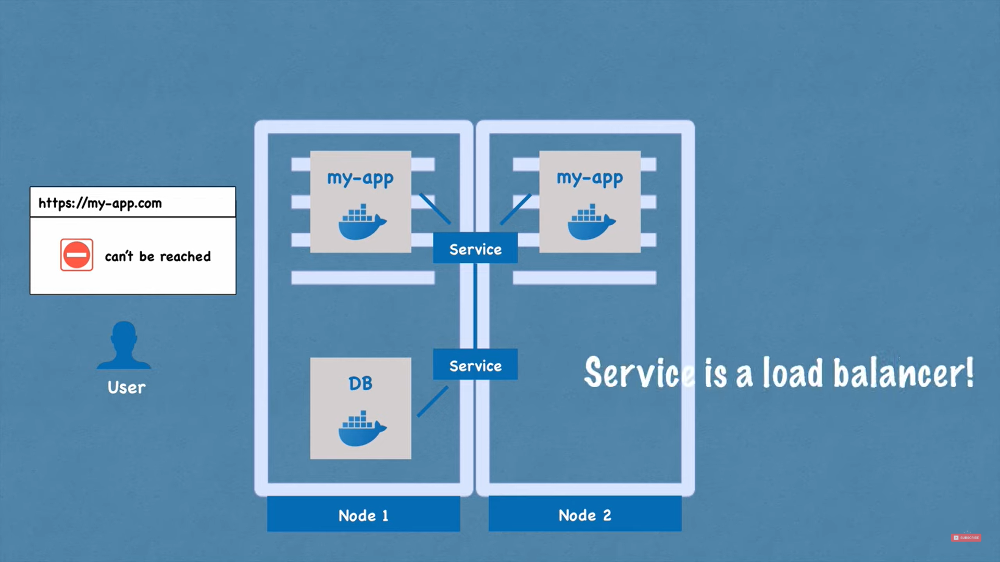

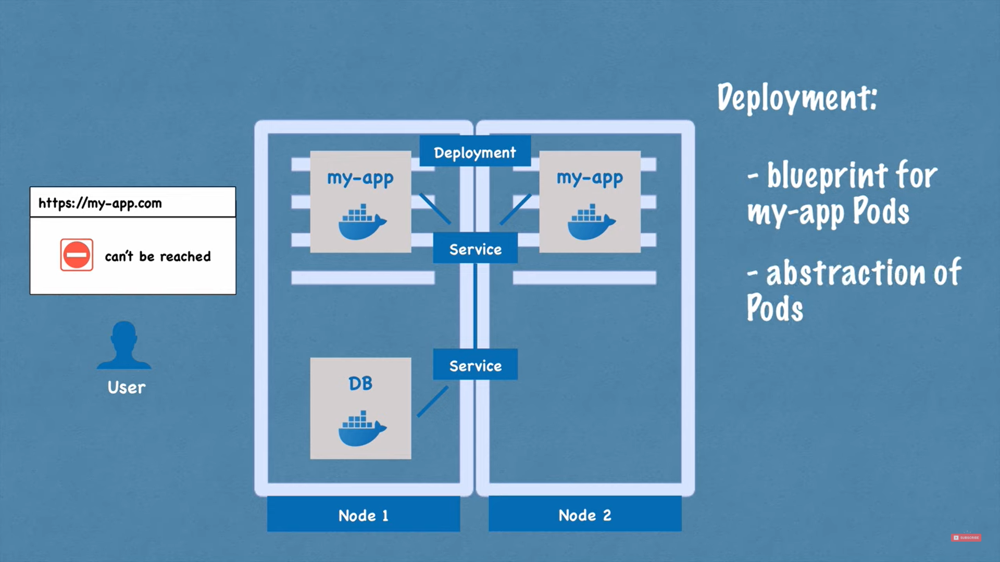

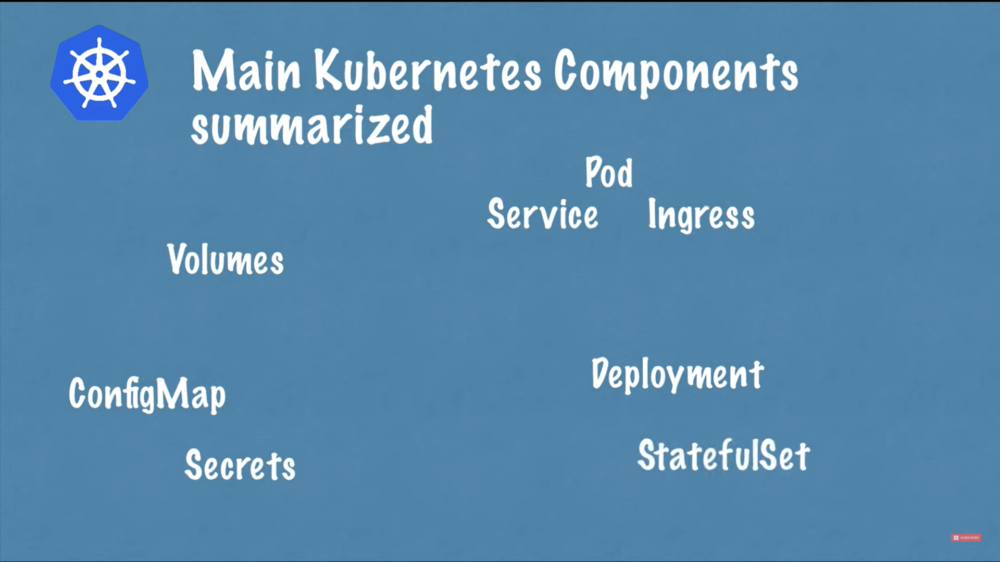

Here’s a comprehensive summary of **TechWorld with Nana – Kubernetes Tutorial 14: "Kubernetes Components explained! Pods, Services, Secrets, ConfigMap"**, which dives into the core components you need to start working with Kubernetes:

---

## 🧱 1. **Pods**

* The **smallest deployable unit** in Kubernetes—a logical host for one or more containers.
* Each pod gets its **own IP address**, and containers within a pod **share network and storage**.
* Pods are **ephemeral**; they’re created, destroyed, and replaced by higher-level controllers like Deployments or StatefulSets. ([YouTube][1])

---

## 🔗 2. **Services**

* Provide a **stable endpoint** (IP + DNS name) to one or more pods, even as pods come and go.
* Use **selectors** (matching pod labels) to determine backend pods.
* Support **load balancing** across multiple pod replicas. ([DEV Community][2], [DEV Community][3])
* Common Service types:

  * **ClusterIP** (internal only)
  * **NodePort** (exposes service on node's port)
  * **LoadBalancer** (cloud provider-controlled external LB)

---

## 🔐 3. **ConfigMap**

* Used to **inject non-sensitive configuration** into pods.
* Can be consumed as:

  * **Environment variables**, or
  * **Mounted files** via volumes.
* Enables changing config **without rebuilding images**, only requiring pod restart. ([DEV Community][3], [Wikipedia][4])

---

## 🔒 4. **Secrets**

* Similar to ConfigMaps, but used for **sensitive data** (passwords, certificates, tokens).
* Stored in **base64 encoded** form (not encrypted by default—you may secure etcd).
* Can be exposed as **env vars** or **mounted files**.
* Ideal for managing credentials securely. ([TechWorld with Nana][5], [Wikipedia][4])

---

## ⚙️ 5. How These Components Fit Together

TechWorld’s demo walks through building a simple stack:

1. **Pod** or **Deployment** running a DB (e.g., MongoDB)
2. **Secret** containing DB credentials
3. **Service** for internal access to the DB
4. Another **Pod/Deployment** (e.g., Mongo Express)
5. **ConfigMap** storing the DB connection string
6. **Service** exposing Mongo Express externally
   This showcases how pods, config, and services interconnect to form a complete, maintainable app architecture. ([DEV Community][6])

---

## 🎯 Why You Need These Components

* **Pods**: run your containerized applications
* **Services**: provide reliable networking and load-balancing between components
* **ConfigMaps**: enable flexible configuration for different environments
* **Secrets**: protect and securely manage sensitive data

Once you understand these, you can effectively build, configure, and expose containerized apps within Kubernetes.

---

### ✅ Nice-to-Have Follow-ups:

* 📄 A **PDF visual diagram** of the Kubernetes component flow
* 🧩 A **YAML manifest template** implementing pods, services, ConfigMaps, and Secrets
* 🧪 A **hands-on lab** to create and test each component in a Minikube cluster

Would you like any of these next, or should we progress to **Tutorial 15: Ingress**?

[1]: https://www.youtube.com/playlist?list=PLy7NrYWoggjziYQIDorlXjTvvwweTYoNC&utm_source=chatgpt.com "Complete Kubernetes Tutorial for Beginners - YouTube"
[2]: https://dev.to/techworld_with_nana/full-kubernetes-course-free-24hp?utm_source=chatgpt.com "Full Kubernetes Course [FREE] - DEV Community"
[3]: https://dev.to/techworld_with_nana/kubernetes-services-simply-explained-d5?utm_source=chatgpt.com "Kubernetes Services simply explained - DEV Community"
[4]: https://en.wikipedia.org/wiki/Kubernetes?utm_source=chatgpt.com "Kubernetes"
[5]: https://www.techworld-with-nana.com/post/kubernetes-configmap-and-secret-explained?utm_source=chatgpt.com "Kubernetes ConfigMap and Secret explained - TechWorld with Nana"
[6]: https://dev.to/techworld_with_nana/complete-guide-to-setting-up-your-application-using-kubernetes-components-51l4?utm_source=chatgpt.com "Complete Guide to setting up your Application using Kubernetes ..."


Here is your 📄 **PDF Visual Diagram Summary** of Kubernetes components:

👉 [Download Kubernetes Component Flow Summary PDF](sandbox:/mnt/data/k8s_component_flow_summary.pdf)

---

Now, let's move on to the next two parts:

## 🧩 Sample YAML Manifest Template

```yaml
# configmap.yaml
apiVersion: v1
kind: ConfigMap
metadata:
  name: app-config
data:
  APP_ENV: "production"
  APP_VERSION: "v1"

---
# secret.yaml
apiVersion: v1
kind: Secret
metadata:
  name: db-secret
type: Opaque
data:
  username: YWRtaW4=        # base64 of 'admin'
  password: c2VjcmV0MTIz     # base64 of 'secret123'

---
# deployment.yaml
apiVersion: apps/v1
kind: Deployment
metadata:
  name: my-app
spec:
  replicas: 2
  selector:
    matchLabels:
      app: my-app
  template:
    metadata:
      labels:
        app: my-app
    spec:
      containers:
        - name: web
          image: nginx
          ports:
            - containerPort: 80
          envFrom:
            - configMapRef:
                name: app-config
            - secretRef:
                name: db-secret

---
# service.yaml
apiVersion: v1
kind: Service
metadata:
  name: my-app-service
spec:
  selector:
    app: my-app
  type: NodePort
  ports:
    - port: 80
      targetPort: 80
      nodePort: 30080
```

---

## 🧪 Hands-On Lab: Try This Locally (Minikube or Kubernetes Cluster)

1. Create all resources:

```bash
kubectl apply -f configmap.yaml
kubectl apply -f secret.yaml
kubectl apply -f deployment.yaml
kubectl apply -f service.yaml
```

2. Verify:

```bash
kubectl get configmap
kubectl get secret
kubectl get pods
kubectl get svc
```

3. Access app (if using Minikube):

```bash
minikube service my-app-service
```

---

Would you like this full YAML lab + explanation as a downloadable `.zip` or PDF? Or should we continue with **Tutorial 15: Kubernetes Ingress**?
